<img src="Archivos/miia.jpg" width=800x>

# Laboratorio 2

## Hito: desarrollo de una herramienta analítica usando paquetes especializados para análisis de datos en Python

Este laboratorio corresponde al 34% de la calificación total del curso y su entrega está planteada para el final de la semana 8. Su objetivo es poner en práctica las competencias adquiridas sobre el uso de los paquetes Pandas, Seaborn y Scikit Learn, entre otros, para hacer exploración, análisis descriptivo, y abordar preguntas de negocio para un caso basado en datos reales. 

Especificamente, al desarrollar este laboratorio pondrás a prueba tus habilidades para:

1. Identificar y abordar una pregunta de negocio a partir de un contexto dado.
2. Cargar datos desde archivos utilizando métodos de Pandas.
3. Explorar, manejar, limpiar y agregar DataFrames.
5. Implementar análisis combinando métricas descriptivas, visualización, filtrado y agrupación.
6. Implementar análisis basado en modelos estadísticos o de machine learning.
7. Utilizar paquetes como ipywidgets o panel para agregar interactividad a los análisis de manera sencilla.

Te recomendamos leer por completo el enunciado del laboratorio antes de comenzar, de forma que tengas claro el propósito completo de la actividad, y puedas desarrollar tu solución apuntando a él en cada paso.

##  Contexto: *Desigualdad y factores de éxito en Pruebas "Saber 11" (Colombia)*

El ICFES es el Instituto Colombiano para el Fomento de la Educación Superior y está adscrito al Ministerio de Educación a nivel nacional. Como parte de sus funciones, el ICFES administra las pruebas *Saber 11*, las cuales evalúan a todos los estudiantes del país al final de su educación secundaria. El examen contiene preguntas que evalúan una variedad de áreas del conocimiento (p.ej., matemáticas, ciencias naturales), y se lleva a cabo dos veces al año, respondiendo a los diferentes calendarios académicos que siguen las instituciones educativas. Al momento de inscribirse a las pruebas, los estudiantes deben llenar un formulario que recoge información socio-demográfica y relacionada con la institución a la que pertenecen, con el fin de obtener evidencia respecto al desempeño de los estudiantes en la prueba según sus condiciones particulares.

<img src="Archivos/saberpro.png" width=700x>

Al igual que otros países de la región, Colombia tiene grandes retos en términos de desigualdad, particularmente en el contexto de educación primaria y secundaria. Por esta razón, para el Estado colombiano es muy valioso el amplio registro de datos que el ICFES genera alrededor de las Pruebas Saber 11, pues con ellos se pueden generar análisis sobre la calidad de la educación en el país y eventualmente dar lugar a recomendaciones sobre políticas públicas. En particular, la problemática a abordar en este caso de estudio es *desigualdad y factores de éxito en las pruebas Saber 11*. 

Los objetivos de este caso de estudio son:

* Entender el contenido de los archivos de datos proporcionados sobre las pruebas Saber11, generar un reporte acerca de sus características principales, e identificar qué partes de dicho contenido serán relevantes para el análisis.
* Identificar características de las variables de interés y relaciones entre ellas, por ejemplo, a través de agrupación, visualizaciones, y descriptivos en general.
* Abordar preguntas de negocio relacionadas con la problemática planteada, particularmente con respecto a los factores que puedan incidir significativamente en el puntaje de una persona que presenta la prueba; especialmente aquellos que se relacionen con mal desempeño.
* Generar una herramienta sencilla que permita a un usuario interactuar con alguno de los análisis realizados de forma relevante en el contexto del problema.

# 1. Entender el contenido de los archivos de datos

Esta misión consiste en hacerse una idea general del contenido de los datos y seleccionar un segmento de ellos que tenga potencial para los análisis propuestos.

Pautas generales:
* Leer los archivos de datos y agregarlos según sea necesario.
* Inspeccionar el archivo a partir de su encabezado, columnas, descripciones de las variables según su tipo (numéricas, categóricas).
* Definir un sub-conjunto de variables (e.g., una lista) que puedan ser relevantes para la problemática de interés.

Preguntas guía:
* ¿Qué dimensiones tienen los datos?
* ¿Con cuántos años y periodos de evaluación se cuenta?
* ¿Cuáles variables pueden ser de interés para la problemática planteada?
* ¿Qué porcentaje de datos faltantes o no válidos hay en las columnas de interés? ¿Podría eso afectar el análisis, y cómo abordarlo?

Esta misión corresponde a trabajo interno del analista, por lo cual no tiene un entregable para el cliente. Como entregable, puedes generar un reporte básico sobre el contenido de los archivos de datos, ya sea a través de la impresión de mensajes, la presentación de tablas resumen, u otros.

### 1.1 Archivos utilizados como entrada al análisis

Se tomó como base para el análisis las bases de datos de los resultados de las pruebas *Saber 11* para el año 2020. Estos datos están guardados en dos archivos llamados *SB11_20201.txt* y *SB11_20202.txt* descargados de la web del Ifces [enlace](https://www.icfes.gov.co/web/guest/investigadores-y-estudiantes-posgrado/acceso-a-bases-de-datos "Acceso a bases de datos del Icfes").

In [10]:
# Carga librerías y lectura de datos pruebas Saber11 de 2020
import numpy as np
import pandas as pd

SB201 = pd.read_csv("Archivos/SB11_20201.txt", sep="¬", engine='python')
SB202 = pd.read_csv("Archivos/SB11_20202.txt", sep="¬", engine='python')



### 1.2 Entendiendo los archivos

En esta parte se exploran las dimensiones de los archivos, campos que contienen, datos faltantes, etc.

In [27]:
#Dimensiones de los archivos y creación de una base única
print('Total de columnas del archivo 1 de 2020: ', SB201.shape[1])
print('Total de filas del archivo 1 de 2020: ', SB201.shape[0])
print('Total de columnas del archivo 2 de 2020: ', SB202.shape[1])
print('Total de filas del archivo 2 de 2020: ', SB202.shape[0])

SB2020 = SB201.append(SB202)
print('Total de columnas del archivo total de 2020: ', SB2020.shape[1])
print('Total de filas del archivo total de 2020: ', SB2020.shape[0])


Total de columnas del archivo 1 de 2020:  81
Total de filas del archivo 1 de 2020:  15435
Total de columnas del archivo 2 de 2020:  81
Total de filas del archivo 2 de 2020:  504872
Total de columnas del archivo total de 2020:  81
Total de filas del archivo total de 2020:  520307


In [40]:
#Inspeccionando el total de campos de la base
SB2020.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 520307 entries, 0 to 504871
Data columns (total 81 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   ESTU_TIPODOCUMENTO             520307 non-null  object 
 1   ESTU_NACIONALIDAD              520307 non-null  object 
 2   ESTU_GENERO                    520298 non-null  object 
 3   ESTU_FECHANACIMIENTO           520307 non-null  object 
 4   PERIODO                        520307 non-null  int64  
 5   ESTU_CONSECUTIVO               520307 non-null  object 
 6   ESTU_ESTUDIANTE                520307 non-null  object 
 7   ESTU_PAIS_RESIDE               520307 non-null  object 
 8   ESTU_TIENEETNIA                516550 non-null  object 
 9   ESTU_DEPTO_RESIDE              519541 non-null  object 
 10  ESTU_COD_RESIDE_DEPTO          519541 non-null  float64
 11  ESTU_MCPIO_RESIDE              519541 non-null  object 
 12  ESTU_COD_RESIDE_MCPIO         

Se muestra que la base de datos tiene en su mayoría variables categóricas que corresponden a la descripción del estudiante que presentó la prueba, las variable numéricas que pueden ser interesantes son las del resultado de la prueba como tal, sin embargo se debe decidir bien sobre qué variable se va a realizar el análisis, dado que estas variables numéricas del resultado pueden estar mostrando la misma información, a saber:

* Puntaje
* Desempeño
* Percentil

Aunque las variables son diferentes y presentan una escala de medición diferente, al final se trata de la misma información. 
Por otro lado, se tiene una variable de puntaje global, que claramente es la suma o la combinación lineal de los demás puntajes por área de estudio. El presente análisis se enfocará en la variable puntaje global, dado que muestra de manera resumida el desempeño general del estudiante en las pruebas *Saber 11*.

In [34]:
#Datos faltantes
numna = SB2020.isnull().sum() 
numna = numna[numna != 0]
numnap = numna.apply(lambda x: 100*x/520307)
dfnumna = pd.concat([numna, numnap], axis = 1)
dfnumna = dfnumna.rename(columns = {0:'Número de datos faltantes', 1:'% de datos faltantes'})
print('')
print('Lista de campos con datos faltantes')
print('')
print(dfnumna)
#dfnumna.describe()



Lista de campos con datos faltantes

                               Número de datos faltantes  % de datos faltantes
ESTU_GENERO                                            9              0.001730
ESTU_TIENEETNIA                                     3757              0.722074
ESTU_DEPTO_RESIDE                                    766              0.147221
ESTU_COD_RESIDE_DEPTO                                766              0.147221
ESTU_MCPIO_RESIDE                                    766              0.147221
ESTU_COD_RESIDE_MCPIO                                766              0.147221
FAMI_ESTRATOVIVIENDA                               18510              3.557515
FAMI_PERSONASHOGAR                                 16580              3.186580
FAMI_CUARTOSHOGAR                                  17278              3.320732
FAMI_EDUCACIONPADRE                                14539              2.794312
FAMI_EDUCACIONMADRE                                15030              2.888679
FAMI_TRABAJOLA

En total 41 campos de los 81 contienen datos faltantes, sin embargo, el porcentaje de estos datos faltantes es relativamente bajo (en promedio el 2,6%), llama la atención el campo *COLE_BILINGUE*, el cual indica si el establecimiento educativo es bilingüe o no, cuyo porcentaje de datos faltantes es del 16.5%. Inicialmente un número tan bajo de datos faltantes -en los campos diferentes a *COLE_BILINGUE*- no representa un riesgo para el análisis y sus posibles conclusiones.

##### Variables que pueden ser de interés en el análisis

Para abordar el análisis, incialmente las variables de la base que pueden interesar son las demográficas y socioeconómicas del estudiante, tales como género, etnia, estrato de la vivienda donde vive, nivel educativo de los padres, etc; adicionalmente información del colegio donde estudia como género, naturaleza, calendario, entre otros; y por último los resultados de la prueba como tal.

In [123]:
#Selección inicial de variables
sel_var = ["ESTU_TIPODOCUMENTO", "ESTU_NACIONALIDAD", "ESTU_GENERO", "ESTU_TIENEETNIA", "FAMI_ESTRATOVIVIENDA",
           "FAMI_PERSONASHOGAR", "FAMI_CUARTOSHOGAR", "FAMI_EDUCACIONPADRE", "FAMI_EDUCACIONMADRE", "FAMI_TRABAJOLABORPADRE",
           "FAMI_TRABAJOLABORMADRE", "FAMI_TIENEINTERNET", "FAMI_TIENESERVICIOTV", "FAMI_TIENECOMPUTADOR", "FAMI_TIENELAVADORA",
           "FAMI_TIENEHORNOMICROOGAS", "FAMI_TIENEAUTOMOVIL", "FAMI_TIENEMOTOCICLETA", "FAMI_TIENECONSOLAVIDEOJUEGOS",
           "FAMI_NUMLIBROS", "FAMI_COMELECHEDERIVADOS", "FAMI_COMECARNEPESCADOHUEVO", "FAMI_COMECEREALFRUTOSLEGUMBRE",
           "FAMI_SITUACIONECONOMICA", "ESTU_DEDICACIONLECTURADIARIA", "ESTU_DEDICACIONINTERNET", "ESTU_HORASSEMANATRABAJA",
           "ESTU_TIPOREMUNERACION", "COLE_GENERO", "COLE_NATURALEZA", "COLE_CALENDARIO", "COLE_BILINGUE", "COLE_CARACTER",
           "COLE_NOMBRE_SEDE", "COLE_SEDE_PRINCIPAL", "COLE_AREA_UBICACION", "COLE_JORNADA", 
           "PUNT_LECTURA_CRITICA", "PERCENTIL_LECTURA_CRITICA", "DESEMP_LECTURA_CRITICA", "PUNT_MATEMATICAS", 
           "PERCENTIL_MATEMATICAS", "DESEMP_MATEMATICAS", "PUNT_C_NATURALES", "PERCENTIL_C_NATURALES", "DESEMP_C_NATURALES",
           "PUNT_SOCIALES_CIUDADANAS", "PERCENTIL_SOCIALES_CIUDADANAS", "DESEMP_SOCIALES_CIUDADANAS", "PUNT_INGLES",
           "PERCENTIL_INGLES", "DESEMP_INGLES", "PUNT_GLOBAL", "PERCENTIL_GLOBAL"]

SB2020 = SB2020.loc[:, sel_var]
SB2020.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 520307 entries, 0 to 504871
Data columns (total 54 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   ESTU_TIPODOCUMENTO             520307 non-null  object 
 1   ESTU_NACIONALIDAD              520307 non-null  object 
 2   ESTU_GENERO                    520298 non-null  object 
 3   ESTU_TIENEETNIA                516550 non-null  object 
 4   FAMI_ESTRATOVIVIENDA           501797 non-null  object 
 5   FAMI_PERSONASHOGAR             503727 non-null  object 
 6   FAMI_CUARTOSHOGAR              503029 non-null  object 
 7   FAMI_EDUCACIONPADRE            505768 non-null  object 
 8   FAMI_EDUCACIONMADRE            505277 non-null  object 
 9   FAMI_TRABAJOLABORPADRE         499160 non-null  object 
 10  FAMI_TRABAJOLABORMADRE         501248 non-null  object 
 11  FAMI_TIENEINTERNET             505113 non-null  object 
 12  FAMI_TIENESERVICIOTV          

# 2. Identificar características y relaciones en las variables

Esta misión consiste en utilizar análisis descriptivos para explorar patrones o relaciones en las variables de interés para la problemática planteada.

Pautas generales:
* Utilizar Matplotlib y/o Seaborn para inspeccionar visualmente variables de interés; los métodos `distplot`, `pairplot`, `boxplot`, o `violinplot`, entre otros, pueden ser de utilidad.
* Utilizar el método `groupby` de Pandas, en conjunto con la visualización, para proveer evidencia sobre el impacto de variables socio-demográficas de interés sobre el desempeño de los estudiantes en la prueba.

Preguntas guía:
* ¿Hay patrones de interés en las distribuciones de las variables, o en las relaciones entre ellas?
* ¿Existe algún impacto significativo de variables socio-demográficas en los puntajes globales o por área?
* ¿Sobre cuáles variables vale la pena hacer un análisis más profundo?

El entregable de esta misión es un reporte (p.ej., un conjunto de visualizaciones) que de cuenta de los comportamientos más interesantes que se observen en las variables de interés para el contexto propuesto. El propósito de esta exploración es generar hipótesis o preguntas que guíen análisis más profundos. En ese sentido, con base en lo aprendido en esta sección, identifique las tres preguntas analíticas que plantearía con mayor prioridad, teniendo en cuenta el contexto y los datos disponibles; estas preguntas NO se deben abordar en términos de código para el laboratorio (únicamente formularse).

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns

In [124]:
#Descriptivos
SB2020.describe()

,PUNT_LECTURA_CRITICA,PERCENTIL_LECTURA_CRITICA,DESEMP_LECTURA_CRITICA,PUNT_MATEMATICAS,PERCENTIL_MATEMATICAS,DESEMP_MATEMATICAS,PUNT_C_NATURALES,PERCENTIL_C_NATURALES,DESEMP_C_NATURALES,PUNT_SOCIALES_CIUDADANAS,PERCENTIL_SOCIALES_CIUDADANAS,DESEMP_SOCIALES_CIUDADANAS,PUNT_INGLES,PERCENTIL_INGLES,PUNT_GLOBAL,PERCENTIL_GLOBAL
count,520307.000000,520307.000000,520307.000000,520307.000000,520307.000000,520307.000000,520307.000000,520307.000000,520307.000000,520307.000000,520307.000000,520307.000000,519937.000000,520307.000000,520307.000000,520271.000000
mean,52.368763,50.196332,2.626567,51.245297,50.230437,2.482604,48.430775,50.272291,2.028026,48.441270,50.239732,2.034797,47.418543,50.132697,249.565962,50.102912
std,10.275937,28.908654,0.732275,11.778498,28.874362,0.726234,10.644018,28.865075,0.761446,12.086911,28.889732,0.833176,11.959334,28.935389,49.568905,28.903357
min,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000
25%,45.000000,25.000000,2.000000,43.000000,25.000000,2.000000,40.000000,25.000000,1.000000,39.000000,25.000000,1.000000,39.000000,25.000000,212.000000,25.000000
50%,53.000000,50.000000,3.000000,51.000000,50.000000,3.000000,48.000000,50.000000,2.000000,48.000000,50.000000,2.000000,45.000000,50.000000,246.000000,50.000000
75%,60.000000,75.000000,3.000000,59.000000,75.000000,3.000000,56.000000,75.000000,3.000000,57.000000,75.000000,3.000000,53.000000,75.000000,283.000000,75.000000
max,100.000000,100.000000,4.000000,100.000000,100.000000,4.000000,100.000000,100.000000,4.000000,100.000000,100.000000,4.000000,100.000000,100.000000,500.000000,100.000000


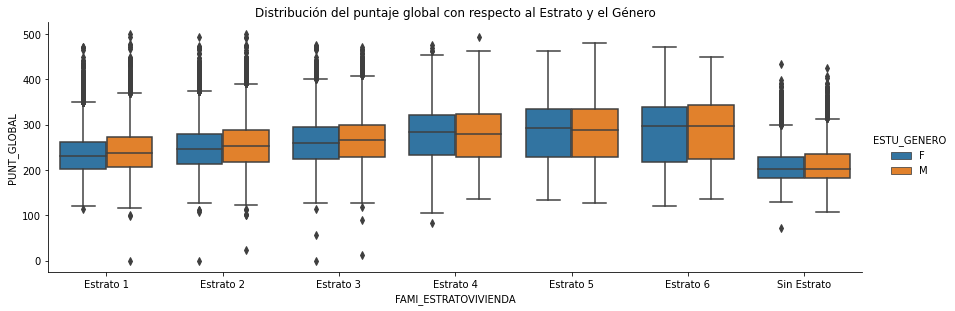

In [125]:
#Descriptivos
g = sns.catplot(x="FAMI_ESTRATOVIVIENDA", y="PUNT_GLOBAL",
                hue="ESTU_GENERO",
                data=SB2020, kind="box", order = ['Estrato 1', 'Estrato 2', 'Estrato 3', 'Estrato 4', 'Estrato 5', 'Estrato 6', 'Sin Estrato'],
                height=4, aspect=3)
g.set(title = 'Distribución del puntaje global con respecto al Estrato y el Género')

En esta primera gráfica se muestra que hay una ligera tendencia a aumentar el puntaje global con respecto al estrato, a nivel de género el gráfico parece mostrar que no hay muchas diferencias.

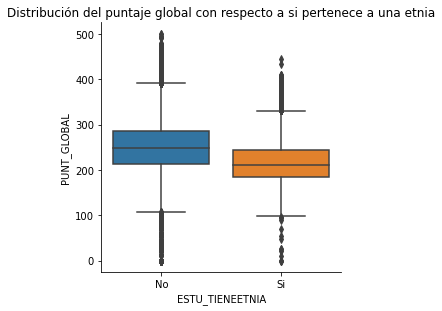

In [126]:

g2 = sns.catplot(x="ESTU_TIENEETNIA", y="PUNT_GLOBAL",
                data=SB2020, kind="box", height=4, aspect=1)
g2.set(title = 'Distribución del puntaje global con respecto a si pertenece a una etnia')

El gráfico muestra la posible existencia de una diferencia en el puntaje global con respecto a si el estudiante pertenece o no a una etnia.

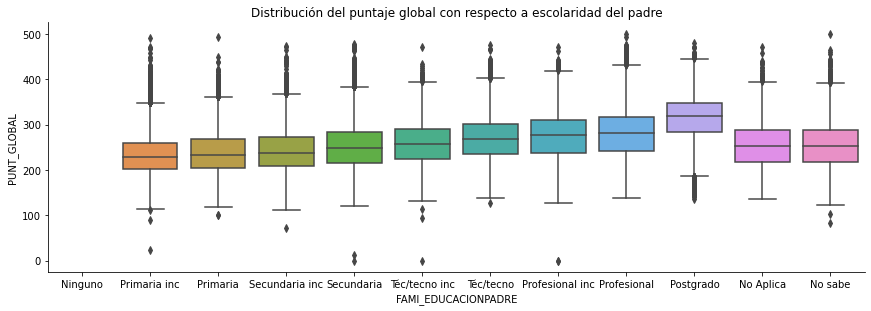

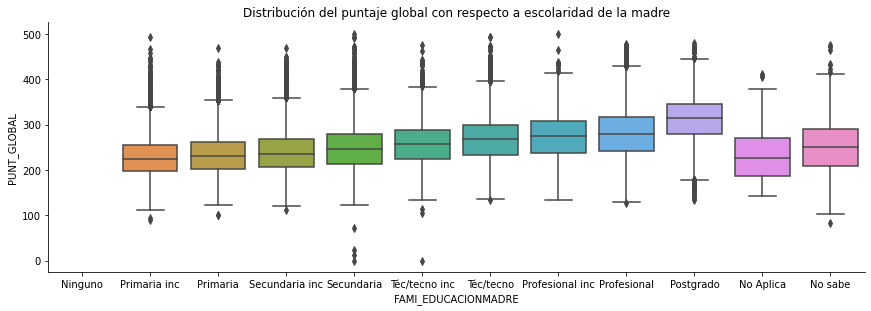

In [127]:
SB2020.FAMI_EDUCACIONPADRE = SB2020.FAMI_EDUCACIONPADRE.replace({"Ninguno":"Ninguno ", "Primaria incompleta":"Primaria inc",
                                                                 "Primaria completa":"Primaria",
                                                                 "Secundaria (Bachillerato) incompleta":"Secundaria inc",
                                                                 "Secundaria (Bachillerato) completa":"Secundaria",
                                                                 "Técnica o tecnológica incompleta":"Téc/tecno inc",
                                                                 "Técnica o tecnológica completa":"Téc/tecno",
                                                                 "Educación profesional incompleta":"Profesional inc",
                                                                 "Educación profesional completa":"Profesional",
                                                                 "Postgrado":"Postgrado", "No Aplica":"No Aplica",
                                                                 "No sabe":"No sabe"})

SB2020.FAMI_EDUCACIONMADRE = SB2020.FAMI_EDUCACIONMADRE.replace({"Ninguno":"Ninguno ", "Primaria incompleta":"Primaria inc",
                                                                 "Primaria completa":"Primaria",
                                                                 "Secundaria (Bachillerato) incompleta":"Secundaria inc",
                                                                 "Secundaria (Bachillerato) completa":"Secundaria",
                                                                 "Técnica o tecnológica incompleta":"Téc/tecno inc",
                                                                 "Técnica o tecnológica completa":"Téc/tecno",
                                                                 "Educación profesional incompleta":"Profesional inc",
                                                                 "Educación profesional completa":"Profesional",
                                                                 "Postgrado":"Postgrado", "No Aplica":"No Aplica",
                                                                 "No sabe":"No sabe"})

g3 = sns.catplot(x="FAMI_EDUCACIONPADRE", y="PUNT_GLOBAL",
                data=SB2020, kind="box", height=4, aspect=3, order = ["Ninguno", "Primaria inc", "Primaria", "Secundaria inc",
                                                                      "Secundaria", "Téc/tecno inc", "Téc/tecno", 
                                                                      "Profesional inc", "Profesional", "Postgrado", 
                                                                      "No Aplica", "No sabe"])
g3.set(title = 'Distribución del puntaje global con respecto a escolaridad del padre')

g4 = sns.catplot(x="FAMI_EDUCACIONMADRE", y="PUNT_GLOBAL",
                data=SB2020, kind="box", height=4, aspect=3, order = ["Ninguno", "Primaria inc", "Primaria", "Secundaria inc",
                                                                      "Secundaria", "Téc/tecno inc", "Téc/tecno", 
                                                                      "Profesional inc", "Profesional", "Postgrado", 
                                                                      "No Aplica", "No sabe"])
g4.set(title = 'Distribución del puntaje global con respecto a escolaridad de la madre')



Los gráficos parecen mostrar una relación entre el nivel de escolaridad de los padres y el desempeño en la prueba *Saber 11*.

Distribución del puntaje global con respecto a algunas características del hogar


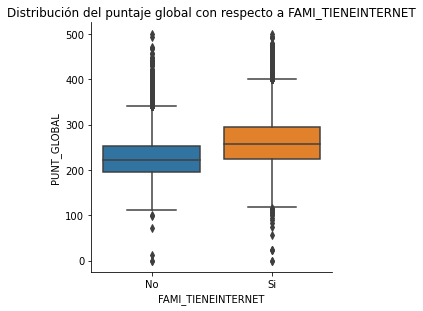

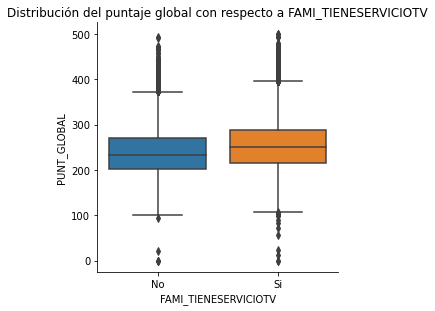

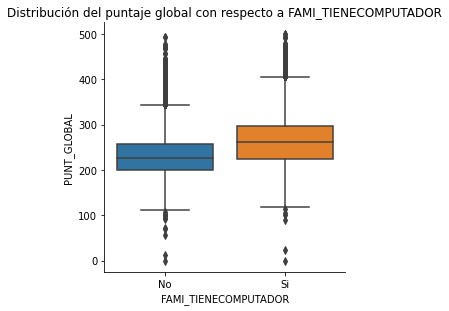

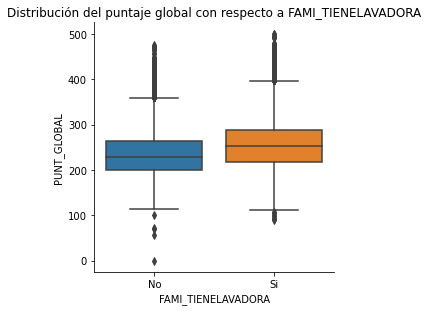

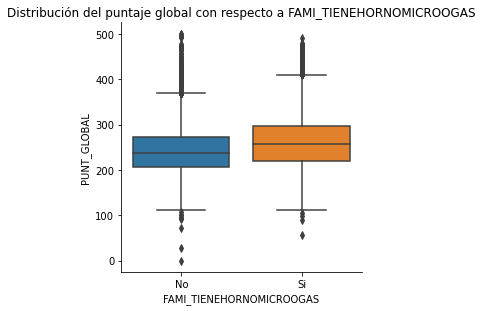

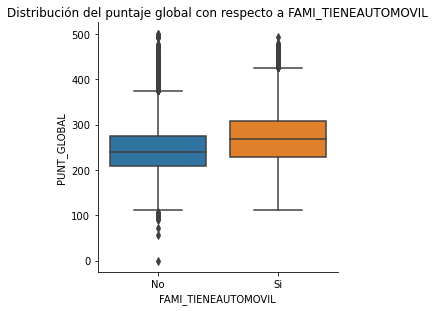

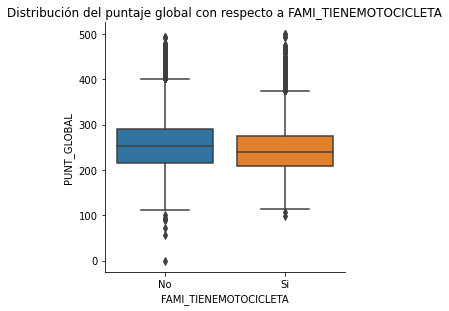

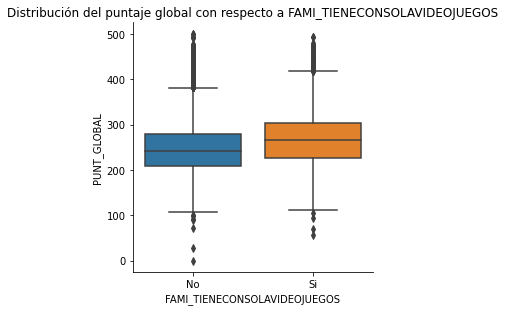

In [128]:
p_hogar = ["FAMI_TIENEINTERNET", "FAMI_TIENESERVICIOTV", "FAMI_TIENECOMPUTADOR", "FAMI_TIENELAVADORA", 
           "FAMI_TIENEHORNOMICROOGAS", "FAMI_TIENEAUTOMOVIL", "FAMI_TIENEMOTOCICLETA", "FAMI_TIENECONSOLAVIDEOJUEGOS"]
print('Distribución del puntaje global con respecto a algunas características del hogar')
for i in p_hogar:
    g5 = sns.catplot(x=i, y="PUNT_GLOBAL", data=SB2020, kind="box", height=4, aspect=1)
    g5.set(title = 'Distribución del puntaje global con respecto a '+i)

El desempeño en la prueba parece verse afectado por algunas características en el hogar, tales como si tiene internet, computadora, automóvil y consola de videojuegos.

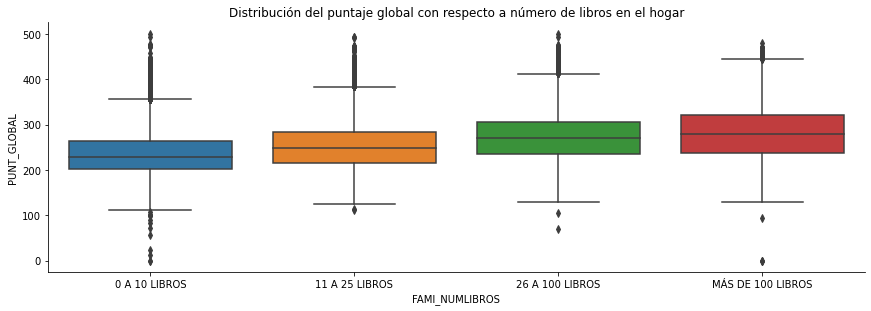

In [129]:
g6 = sns.catplot(x="FAMI_NUMLIBROS", y="PUNT_GLOBAL", data=SB2020, kind="box", height=4, aspect=3)
g6.set(title = 'Distribución del puntaje global con respecto a número de libros en el hogar')

El número de libros en el hogar también parece que muestra tener relación con el puntaje global de la prueba.

Distribución del puntaje global con respecto a algunas características de nutrición


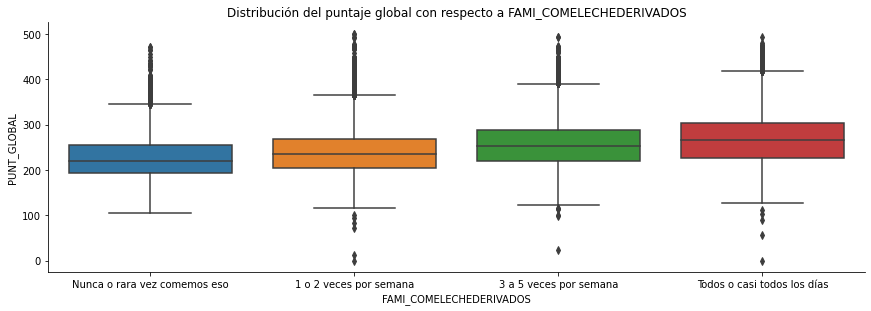

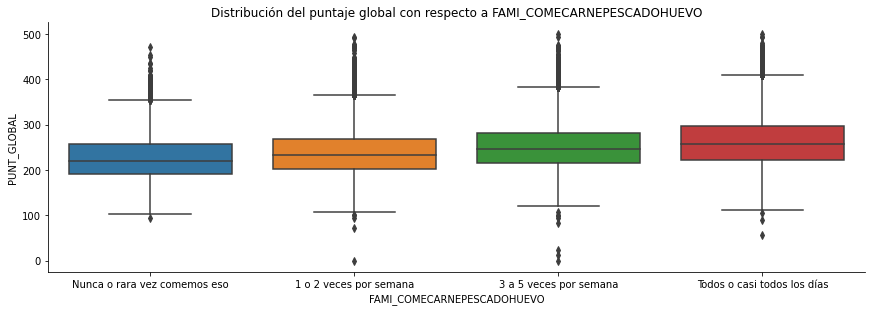

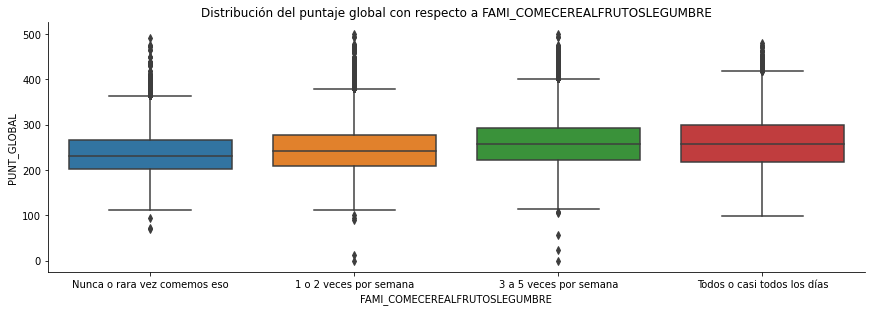

In [130]:
p_nutri = ["FAMI_COMELECHEDERIVADOS", "FAMI_COMECARNEPESCADOHUEVO", "FAMI_COMECEREALFRUTOSLEGUMBRE"]
print('Distribución del puntaje global con respecto a algunas características de nutrición')
for i in p_nutri:
    g7 = sns.catplot(x=i, y="PUNT_GLOBAL", data=SB2020, kind="box", height=4, aspect=3, order = ["Nunca o rara vez comemos eso",
                                                                                                 "1 o 2 veces por semana",
                                                                                                 "3 a 5 veces por semana",
                                                                                                 "Todos o casi todos los días"])
    g7.set(title = 'Distribución del puntaje global con respecto a '+i)


La frecuencia con la que el estudiante consume productos como Leche o derivados, Carne (pollo, pavo, res, cordero, cerdo, conejo, etc.), pescados o huevos, Cereales (avena, granola), frutos secos (almendras, maní) o legumbres (frijoles, garbanzos, lentejas), pareciera afectar su desempeño en la prueba, sobre todo si se compara el "nunca" contra el "todos los días".

Distribución del puntaje global con respecto a otras características medidas


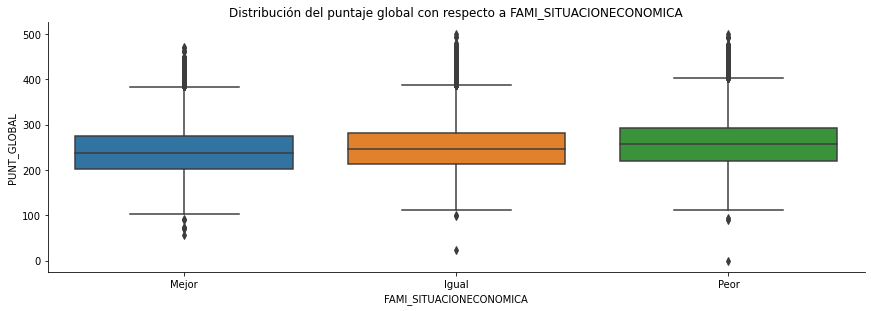

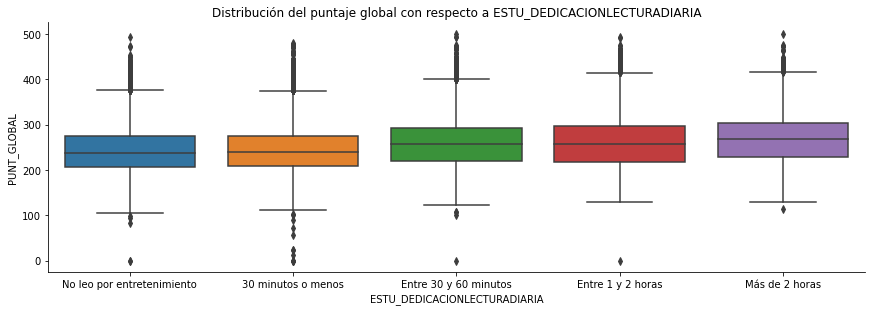

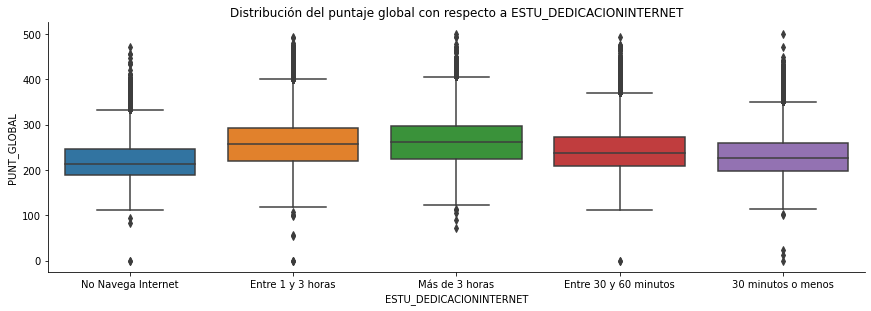

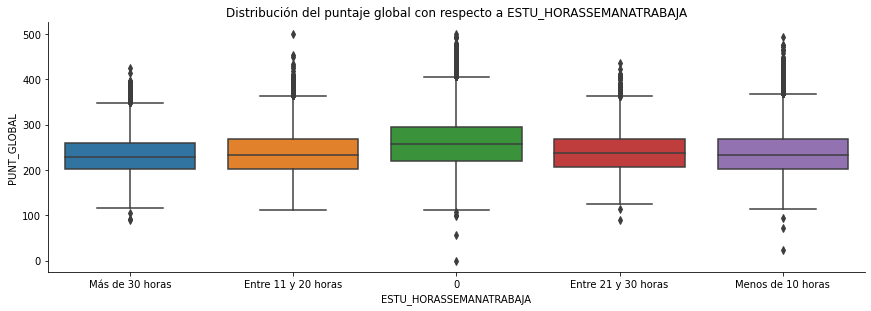

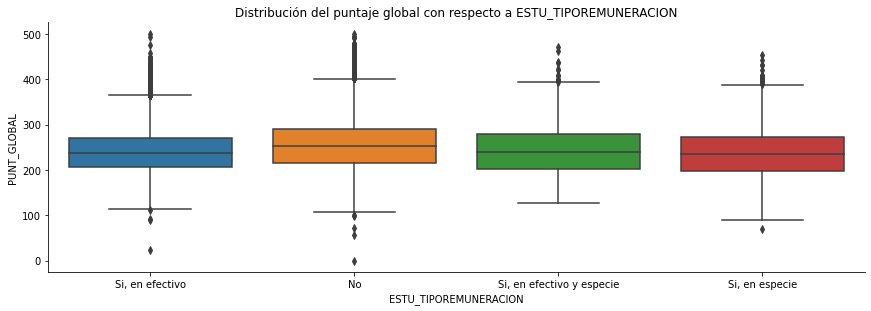

In [131]:
p_otros = ["FAMI_SITUACIONECONOMICA", "ESTU_DEDICACIONLECTURADIARIA", "ESTU_DEDICACIONINTERNET", "ESTU_HORASSEMANATRABAJA",
           "ESTU_TIPOREMUNERACION"]
print('Distribución del puntaje global con respecto a otras características medidas')
for i in p_otros:
    g8 = sns.catplot(x=i, y="PUNT_GLOBAL", data=SB2020, kind="box", height=4, aspect=3)
    g8.set(title = 'Distribución del puntaje global con respecto a '+i)


Distribución del puntaje global con respecto a características del colegio


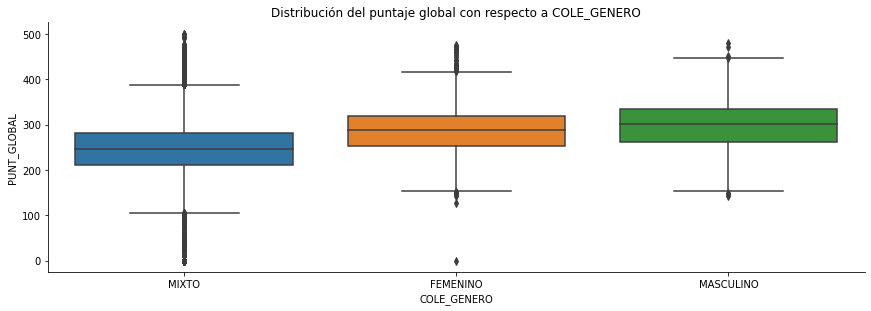

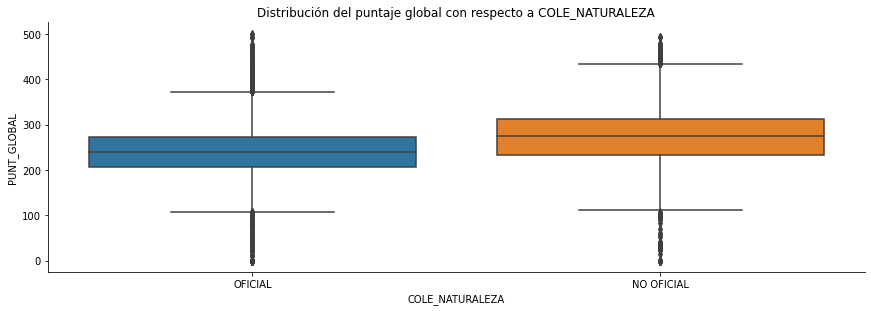

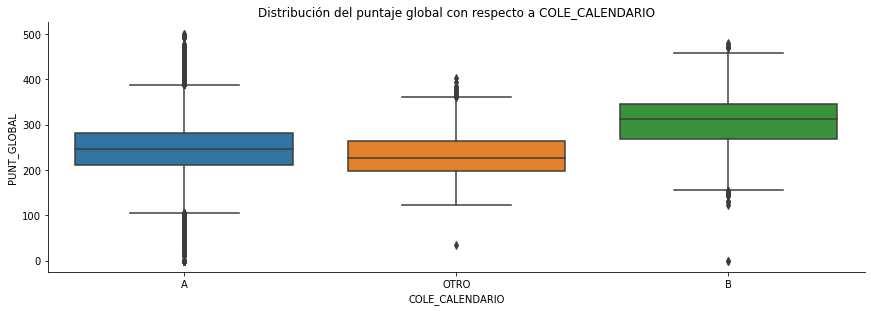

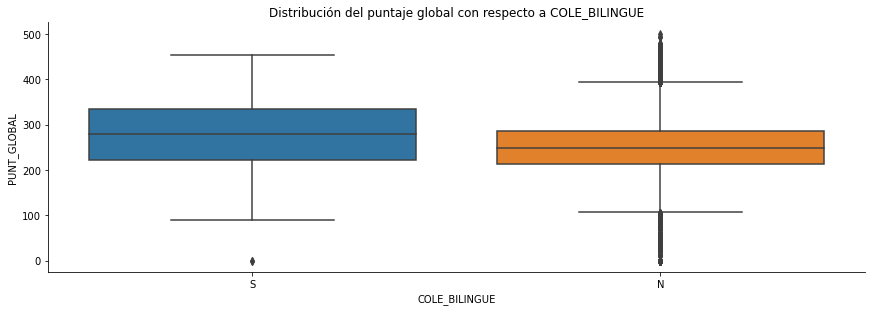

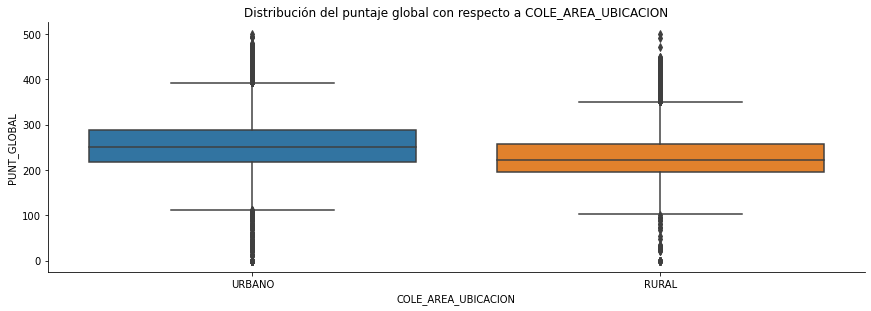

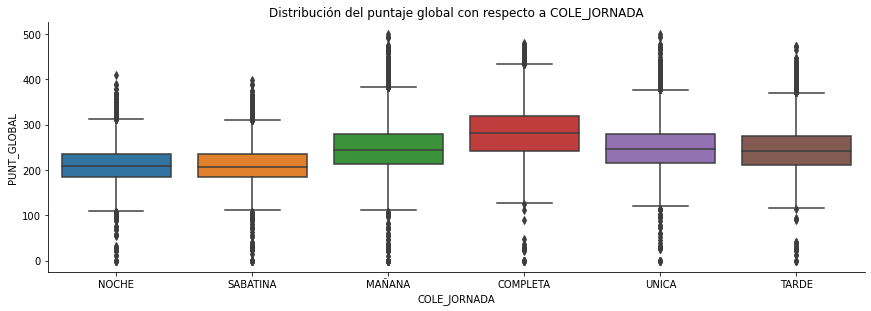

In [132]:
p_cole = ["COLE_GENERO", "COLE_NATURALEZA", "COLE_CALENDARIO", "COLE_BILINGUE", "COLE_AREA_UBICACION", "COLE_JORNADA"]
print('Distribución del puntaje global con respecto a características del colegio')
for i in p_cole:
    g9 = sns.catplot(x=i, y="PUNT_GLOBAL", data=SB2020, kind="box", height=4, aspect=3)
    g9.set(title = 'Distribución del puntaje global con respecto a '+i)


Las características del colegio parecen afectar directamente el desempeño en la prueba *Saber 11*.

Gráficos de dispersión entre resultados de la prueba


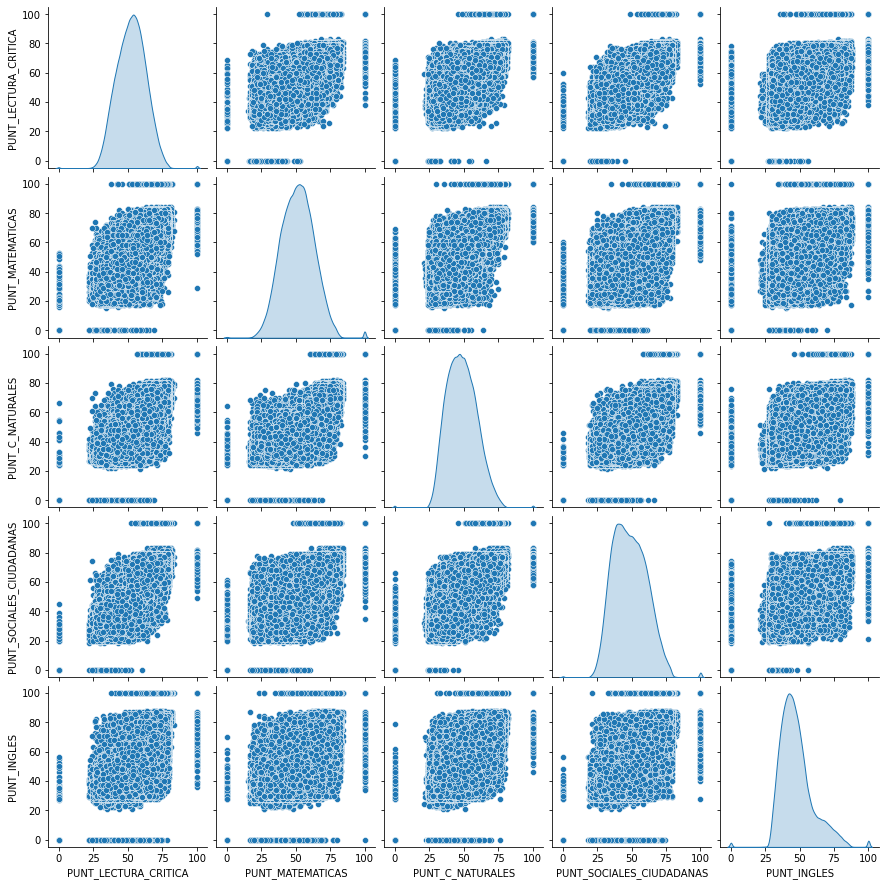

In [133]:
print('Gráficos de dispersión entre resultados de la prueba')
g1 = sns.pairplot(SB2020, vars=['PUNT_LECTURA_CRITICA', 'PUNT_MATEMATICAS', 'PUNT_C_NATURALES', 'PUNT_SOCIALES_CIUDADANAS',
                                'PUNT_INGLES'], diag_kind = 'kde')


No se evidencia relación lineal entre las puntuaciones de las áreas que se evalúan en la prueba *Saber 11*.

# 3. Abordar preguntas de negocio planteadas

Esta misión consiste en proponer, implementar y evaluar el desempeño modelo(s) que busque(n) explicar las relaciones entre factores socio-demográficos y desempeño en la prueba.

Pautas generales:
* Seleccionar variables y proponer modelos acordes a dichas variables y al contexto del problema.
* Utilizar los paquetes StatsModels y Scikit Learn para indagar sobre los aspectos que contribuyen al éxito de los estudiantes. Particularmente, las clases correspondientes a regresión lineal y regresión logística, entre otras, pueden ser útiles.
* Utilizar las métricas de evaluación de desempeño (disponibles en los paquetes mencionados), para concluir sobre la validez de los modelos propuestos.

Preguntas guía:
* ¿Existe algún sub-conjunto de variables socio-demográficas que explique razonablemente bien el desempeño de los estudiantes en la prueba?
* Definiendo como "estudiante en riesgo" a quien tenga un puntaje por debajo del percentil $\alpha$ en más de la mitad de las áreas de la prueba, ¿cuáles variables socio-demográficas permitirían "predecir" si un estudiante pertenecerá a dicho grupo?

El entregable de esta misión es un reporte sobre el desempeño de los modelos propuestos para abordar al menos una de las preguntas guía planteadas, acompañado de una conclusión sobre los resultados del modelo (si son válidos) en el contexto de la problemática planteada.

In [137]:
from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

### 3.1 Regresión lineal múltiple

Se realiza un modelo de regresión lineal múltiple con variable dependiente el puntaje global y variables independientes las analizadas en la fase previa descriptiva.

In [135]:
var_model = ["FAMI_ESTRATOVIVIENDA", "ESTU_TIENEETNIA", "FAMI_EDUCACIONPADRE", "FAMI_EDUCACIONMADRE", "FAMI_TIENEINTERNET", 
             "FAMI_TIENESERVICIOTV", "FAMI_TIENECOMPUTADOR", "FAMI_TIENELAVADORA", "FAMI_TIENEHORNOMICROOGAS", 
             "FAMI_TIENEAUTOMOVIL", "FAMI_TIENEMOTOCICLETA", "FAMI_TIENECONSOLAVIDEOJUEGOS", 
             "FAMI_NUMLIBROS", "FAMI_COMELECHEDERIVADOS", "FAMI_COMECARNEPESCADOHUEVO", "FAMI_COMECEREALFRUTOSLEGUMBRE", 
             "FAMI_SITUACIONECONOMICA", "ESTU_DEDICACIONLECTURADIARIA", "ESTU_DEDICACIONINTERNET", "ESTU_HORASSEMANATRABAJA", 
             "ESTU_TIPOREMUNERACION", "COLE_GENERO", "COLE_NATURALEZA", "COLE_CALENDARIO", "COLE_BILINGUE", 
             "COLE_AREA_UBICACION", "COLE_JORNADA"]

X = SB2020.loc[:, var_model]
y = SB2020.PUNT_GLOBAL

var_dum = pd.get_dummies(X,drop_first=True)

X = X.drop(var_model, axis=1)
X = pd.concat([X, var_dum], axis = 1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

lr = linear_model.LinearRegression()

model = lr.fit(X,y)

print('Parámetros estimados del modelo')
print('Intercepto:', model.intercept_)
print('Betas:', model.coef_)

lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)



Parámetros estimados del modelo
Intercepto: 252.1175429160187
Betas: [  0.27818283  -0.30769251  -0.64900241  -2.16277641  -6.63020919
 -16.33653407 -17.92276863   8.56592055   6.64364285  25.99064343
   2.5854428    2.54526072  11.88539536  11.67121108   4.2865565
   1.67250522  10.86318441   5.84033669 -10.2842022   -0.50217313
  21.34300203  -2.74426139  -4.40597137   8.96749305   8.14838181
   0.13724801  -2.73111492   7.71025346   2.43552259   6.36237625
  -3.4303196    6.89708332  -1.85202773  -2.59478644   2.0621536
  -4.69495372  -0.41166815   4.88682535  12.457612    11.54923004
   4.33602706  -5.57207989   4.7626021    1.99827278  -4.3843359
   1.8655433    3.65982858  -2.12926045  -0.3849071   -8.33286373
   8.23093713   5.93833604   6.5322821    9.75467874  -4.84316485
   5.16537182   0.51654958   4.46706059  -2.80633927 -11.52224399
  -8.42559111 -11.14519082  -8.80965348   3.17519934   1.4863533
   0.63482227   5.21571964  -9.58662471  -6.79841176  16.75392568
 -13.863016

In [136]:
#Anova del modelo
print("Validación del modelo")
X = sm.add_constant(X)

olsmod = sm.OLS(y, X).fit()
print(olsmod.summary())

Validación del modelo
                            OLS Regression Results                            
Dep. Variable:            PUNT_GLOBAL   R-squared:                       0.350
Model:                            OLS   Adj. R-squared:                  0.349
Method:                 Least Squares   F-statistic:                     3584.
Date:                Mon, 29 Nov 2021   Prob (F-statistic):               0.00
Time:                        20:22:34   Log-Likelihood:            -2.6573e+06
No. Observations:              520307   AIC:                         5.315e+06
Df Residuals:                  520228   BIC:                         5.316e+06
Df Model:                          78                                         
Covariance Type:            nonrobust                                         
                                                                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------

La variables indentificadas en el análisis descriptivo se confirman que son importantes a la hora de explicar el puntaje global en las pruebas *Saber 11*, sin embargo, la cantidad de información que éstas recogen es baja, el R cuadrado es del 35%, lo cual hace pensar en indagar e investigar sobre las otras posibles fuentes de variación que están afectando el desempeño en la prueba. Otras medidas de desempeño del modelo son:
* F-estadístico y p-valor: El modelo es globalmente significativo para explicar el puntaje 
* Durbin-Watson: No se evidencia presencia de autocorrelación entre las variables
* Jarque-Bera: Se rechaza la hipótesis de normalidad, sin embargo el Anova tiende a ser robusto frente a falta de normalidad

### 3.2 Regresión logística

Se presenta la función *evalua_riesgo*, la cual estima un modelo de regresión logística, con parámetro *alfa (1-100)* que indica el percentil con el que se clasificará al estudiante en riesgo. La variable dependiente es dicotómica, tomando valor de 1 si el estudiante tiene un puntaje por debajo del percentil *alfa* en más de la mitad de las áreas de la prueba y 0 en cualquier otro caso.

In [141]:

def evalua_riesgo(alfa = 50):
    SB2020['DLEC'] = np.where(SB2020['PERCENTIL_LECTURA_CRITICA'] < alfa, 1, 0)
    SB2020['DMAT'] = np.where(SB2020['PERCENTIL_MATEMATICAS'] < alfa, 1, 0)
    SB2020['DNAT'] = np.where(SB2020['PERCENTIL_C_NATURALES'] < alfa, 1, 0)
    SB2020['DSOC'] = np.where(SB2020['PERCENTIL_SOCIALES_CIUDADANAS'] < alfa, 1, 0)
    SB2020['DING'] = np.where(SB2020['PERCENTIL_INGLES'] < alfa, 1, 0)
    SB2020['DTOT'] = SB2020['DLEC'] + SB2020['DMAT'] + SB2020['DNAT'] + SB2020['DSOC'] + SB2020['DING']
    SB2020['RIESGO'] = np.where(SB2020['DTOT'] > 2, 1, 0)
    
    #X ya estaba definido del modelo de regresión anterior
    y = SB2020['RIESGO']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
    lr = LogisticRegression()
    lr.fit(X_train, y_train)
    y_pred = lr.predict(X_test)
    lrs = lr.score(X_test, y_test)
    
    model = lr.fit(X,y)
    print('Parámetros estimados del modelo')
    print('Intercepto:', model.intercept_)
    print('Betas:', model.coef_)
    print('')
    print('')
    log_reg = sm.Logit(y, X).fit()
    print(log_reg.summary())
    print('')
    print('')
    print('Precisión del modelo:', lrs)
    print('')
    print('Predicciones')
    print(y_pred)

evalua_riesgo()

Parámetros estimados del modelo
Intercepto: [-0.17741132]
Betas: [[-0.17487419 -0.03594894 -0.03435469  0.10796027  0.20685228  0.33671839
   0.87828918  0.82419617 -0.31601149 -0.25397754 -0.93558584 -0.06688165
  -0.03303455 -0.38404383 -0.42240591 -0.15065901 -0.02850488 -0.39460505
  -0.24425427  0.4522793   0.1560421  -0.68823835  0.24445447  0.36281993
  -0.20366189 -0.22075189  0.10001052  0.24648349 -0.22272387 -0.01551592
  -0.32242129  0.17189244 -0.32089453  0.09571557  0.11197685 -0.08675549
   0.20446983  0.00436706 -0.23039669 -0.55668585 -0.4527545  -0.19939147
   0.27490592 -0.19249876 -0.07210192  0.20675372 -0.04031827 -0.15153843
   0.09080055  0.03347215  0.33103983 -0.36005169 -0.25017465 -0.2965046
  -0.49027305  0.21208128 -0.21510925 -0.01508153 -0.22287338  0.13348079
   0.49336016  0.33090471  0.48818427  0.40333026 -0.16568889 -0.18638534
  -0.12249756 -0.11894867  0.52538013  0.19896058  0.92587621  0.87080173
  -0.37814616 -0.34454559  0.5090729   1.8377656

El modelo es globalmente significativo, lo que implica que las variables dentro del modelo ayudan a explicar la probabilidad de que un estudiante sea clasificado en riesgo dado un percentil *alfa*. Sin embargo, como en el modelo de regresión lineal múltiple, hay un porcentaje importante de información que se escapa del modelo. La mayoría de variables son significativas dentro del modelo, salvo algunos niveles de variables como: Educación del Padre - Primaria Incompleta, Educación del Padre - Secundaria Incompleta, Educación de la Madre - Técnico/Tecnológico Incompleto, Tener consola de videojuegos y Dedicación a internet entre 30 y 60 minutos. La precisión del modelo es del 70%. 

# 4. Desarrollar una herramienta interactiva de análisis

Esta misión consiste en desarrollar una herramienta interactiva sencilla (que sea relevante en el contexto del problema) a partir de alguno de los análisis realizados en las secciones 2 o 3.

Pautas generales:
* Seleccionar uno de los análisis previos que pueda verse enriquecido con alguna característica de interactividad.
* Seleccionar los parámetros que el usuario podrá cambiar.
* Desarrollar las funciones que se deben ejecutar con cada acción del usuario.
* Utilizar los paquetes `ipywidgets` o `panel` para implementar la herramienta.

Pregunta guía:
* ¿Cuál(es) es la pregunta que el usuario podrá hacerle a la herramienta, y cómo aporta al análisis?
* ¿Qué aprendizajes clave puede explorar u obtener el usuario con esta herramienta basada en los datos?

El entregable de esta misión es la herramienta implementada, acompañada de las instrucciones necesarias para que un usuario la pueda utilizar.

In [143]:
import panel as pn
import plotly.graph_objects as go
pn.extension('plotly')
import plotly.express as px

In [149]:
titulo = "Distribución del puntaje global"
nombres = ["FAMI_ESTRATOVIVIENDA", "ESTU_TIENEETNIA", "FAMI_EDUCACIONPADRE", "FAMI_EDUCACIONMADRE", "FAMI_TIENEINTERNET", 
             "FAMI_TIENESERVICIOTV", "FAMI_TIENECOMPUTADOR", "FAMI_TIENELAVADORA", "FAMI_TIENEHORNOMICROOGAS", 
             "FAMI_TIENEAUTOMOVIL", "FAMI_TIENEMOTOCICLETA", "FAMI_TIENECONSOLAVIDEOJUEGOS", 
             "FAMI_NUMLIBROS", "FAMI_COMELECHEDERIVADOS", "FAMI_COMECARNEPESCADOHUEVO", "FAMI_COMECEREALFRUTOSLEGUMBRE", 
             "FAMI_SITUACIONECONOMICA", "ESTU_DEDICACIONLECTURADIARIA", "ESTU_DEDICACIONINTERNET", "ESTU_HORASSEMANATRABAJA", 
             "ESTU_TIPOREMUNERACION", "COLE_GENERO", "COLE_NATURALEZA", "COLE_CALENDARIO", "COLE_BILINGUE", 
             "COLE_AREA_UBICACION", "COLE_JORNADA"]
seleccion1 = pn.widgets.Select(name='Variables socio demográficas', options= nombres)

@pn.depends(seleccion1.param.value)

def funcion_interactiva(seleccion1): 
    df = SB2020
    df = df.fillna('')
    filtro = df[seleccion1] != ''
    df2 = df[filtro]
    fig = go.Figure(px.box(
                            df2,
                            x=seleccion1,
                            y="PUNT_GLOBAL",
                            
                          )
                   )
                
    return fig
tablero_control = pn.Column(pn.Row(titulo, seleccion1), funcion_interactiva) 
tablero_control.servable()

Column
    [0] Row
        [0] Markdown(str)
        [1] Select(name='Variables socio d..., options=['FAMI_ESTRATOVIVIENDA', ...], value='FAMI_ESTRATOVIVIENDA')
    [1] ParamFunction(function)

Este visualizador interactivo permite ver la distribución del puntaje global de las pruebas *Saber 11* a través de todas las variables sociodemográficas y socioeconómicas medidas en la base.